In [1]:
%%time

import sys

sys.path.append('../')
sys.path.append('/usr/local/bin')

import numpy as np
from pygeo.segyread import SEGYFile
from pygeo.fullpy import readini
from pymatsolver import MumpsSolver
from zephyr.backend import MiniZephyr, Eurus
from zephyr.middleware import HelmBaseProblem, HelmBaseSurvey, FullwvDatastore

CPU times: user 265 ms, sys: 57 ms, total: 322 ms
Wall time: 319 ms


In [2]:
%%time

fds = FullwvDatastore('noel')
systemConfig = fds.systemConfig

systemConfig.update({
    'disc':     MiniZephyr,
    'Solver':   MumpsSolver,
})

problem = HelmBaseProblem(systemConfig)
survey  = HelmBaseSurvey(systemConfig)
problem.pair(survey)

CPU times: user 40.9 ms, sys: 4.99 ms, total: 45.9 ms
Wall time: 44.9 ms


In [3]:
%%time

print('Running %(nfreq)d frequencies and %(nsrc)s sources'%{'nfreq': survey.nfreq, 'nsrc': survey.nsrc})

dPred = survey.dpred().reshape((survey.nrec, survey.nsrc, survey.nfreq))

Running 20 frequencies and 265 sources
CPU times: user 9.07 s, sys: 10.6 s, total: 19.7 s
Wall time: 41.8 s


In [4]:
%pylab inline
matplotlib.rcParams['savefig.dpi'] = 300

Populating the interactive namespace from numpy and matplotlib


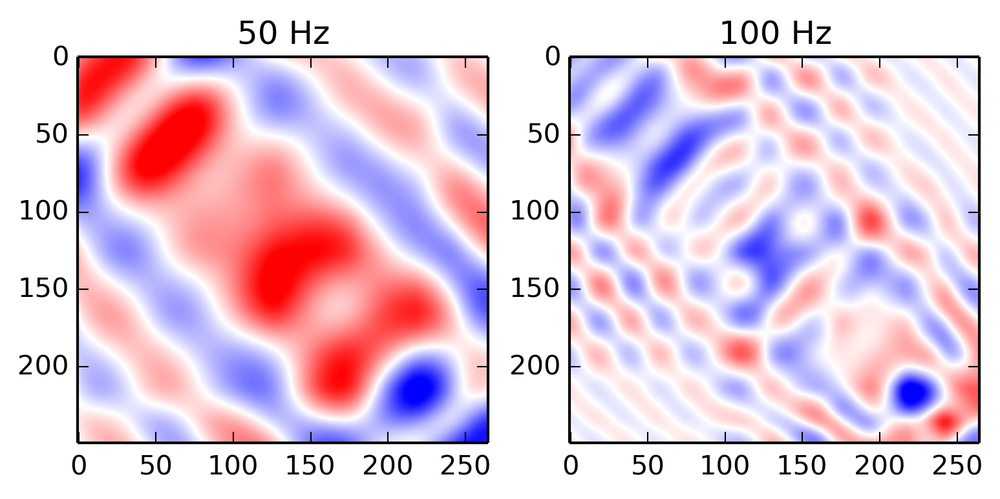

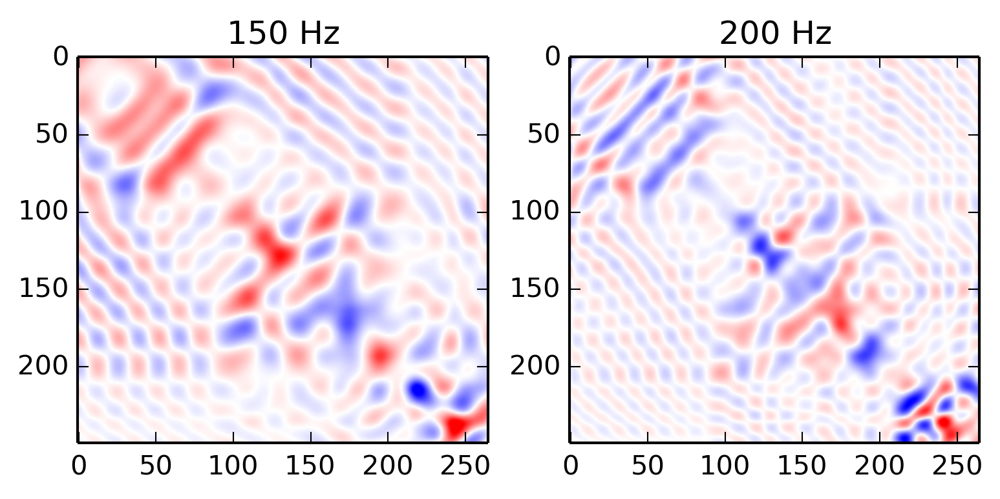

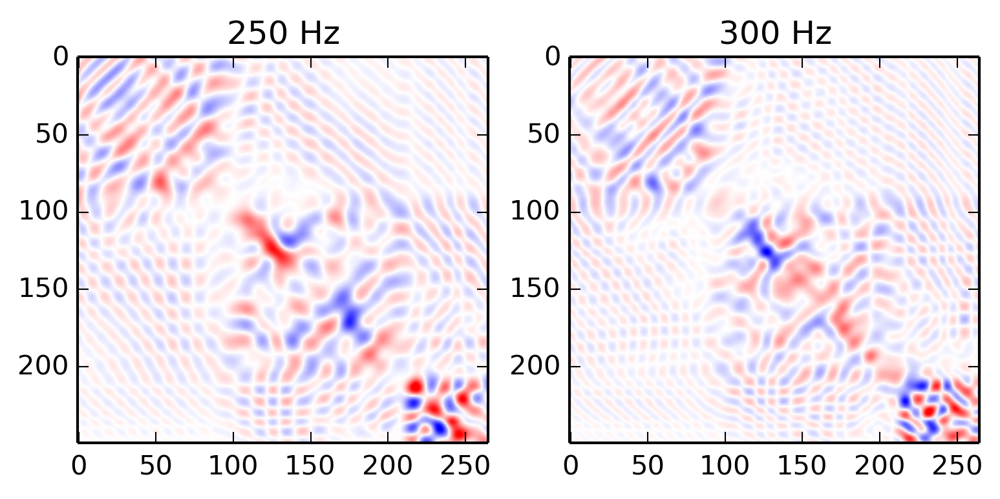

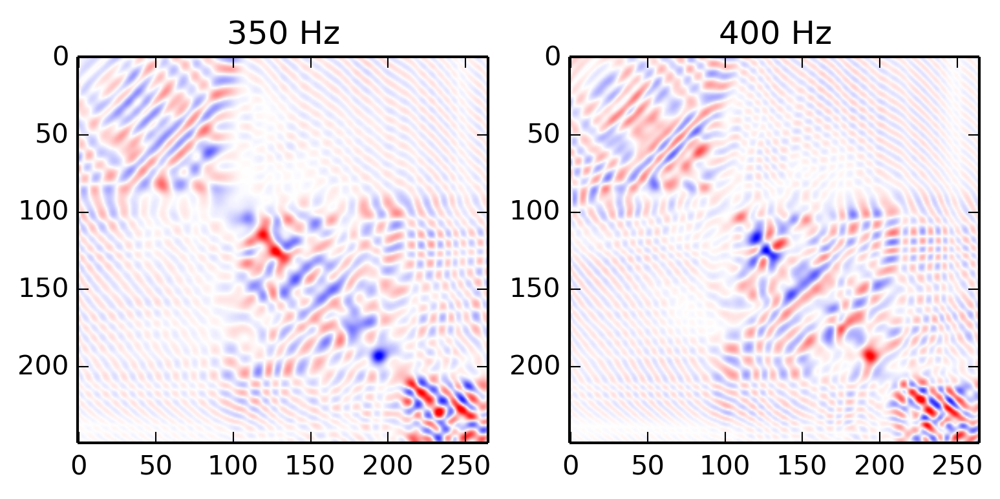

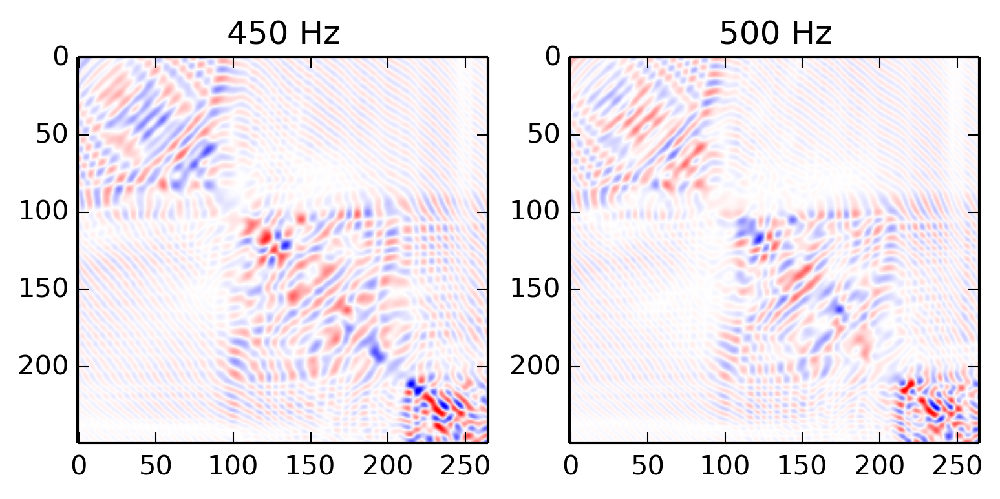

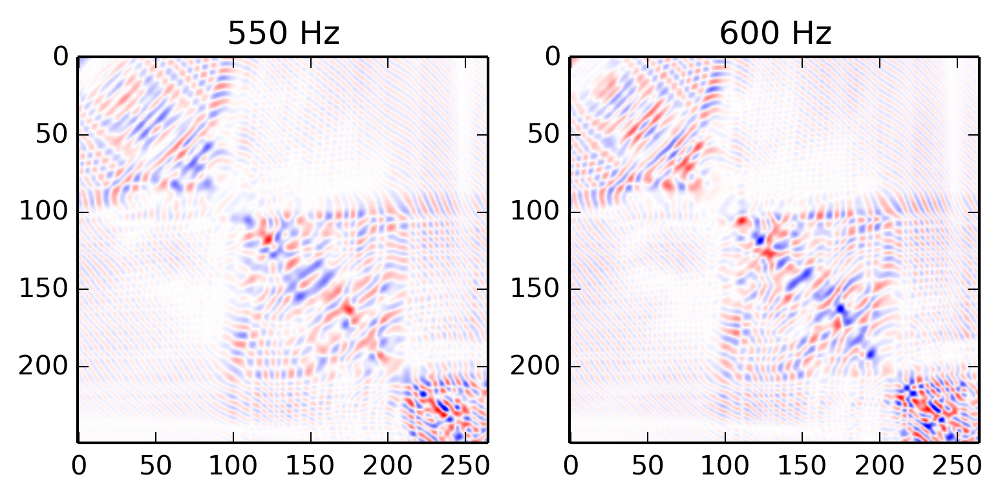

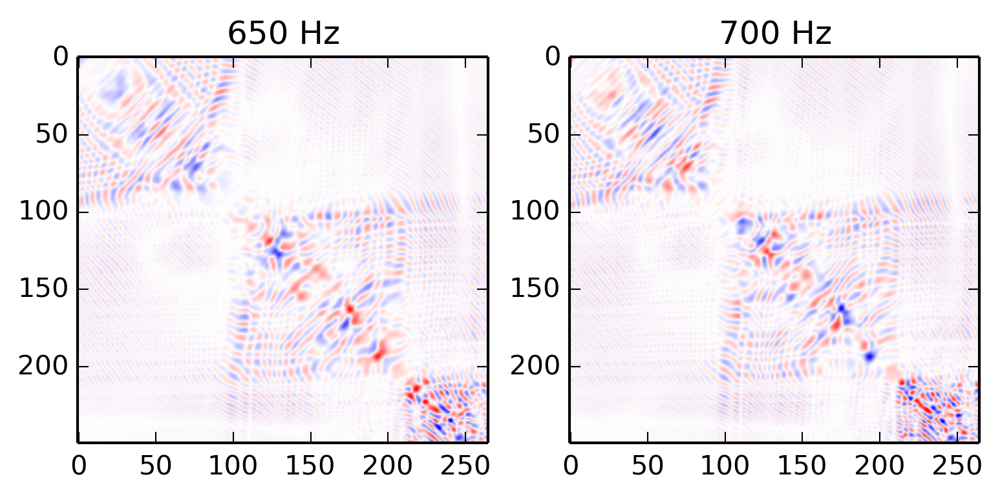

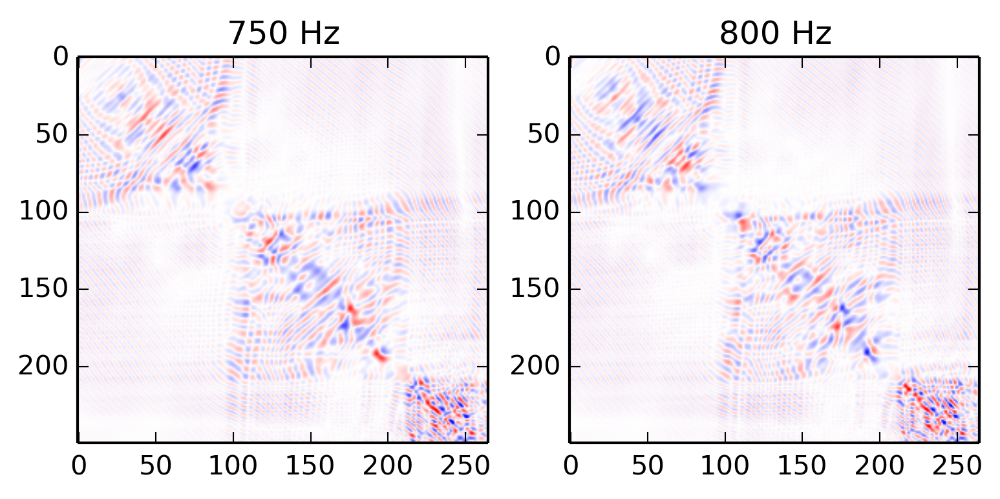

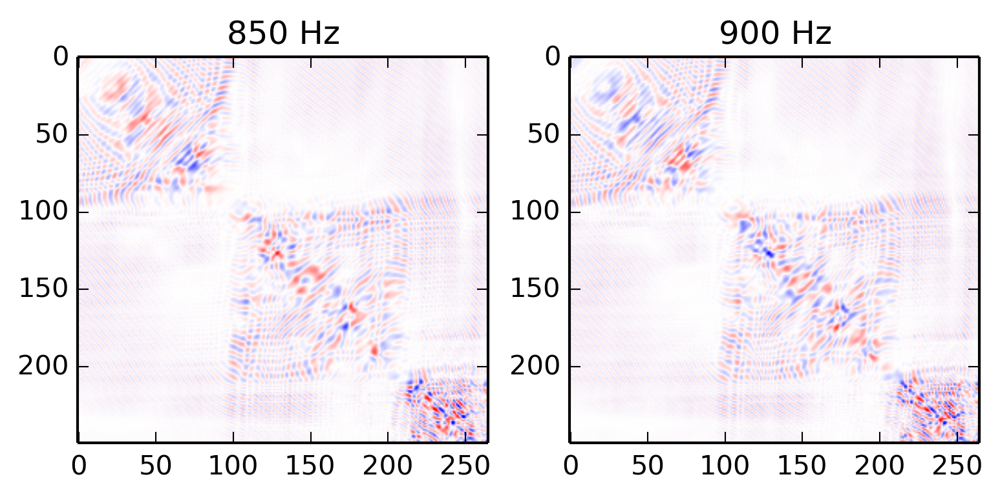

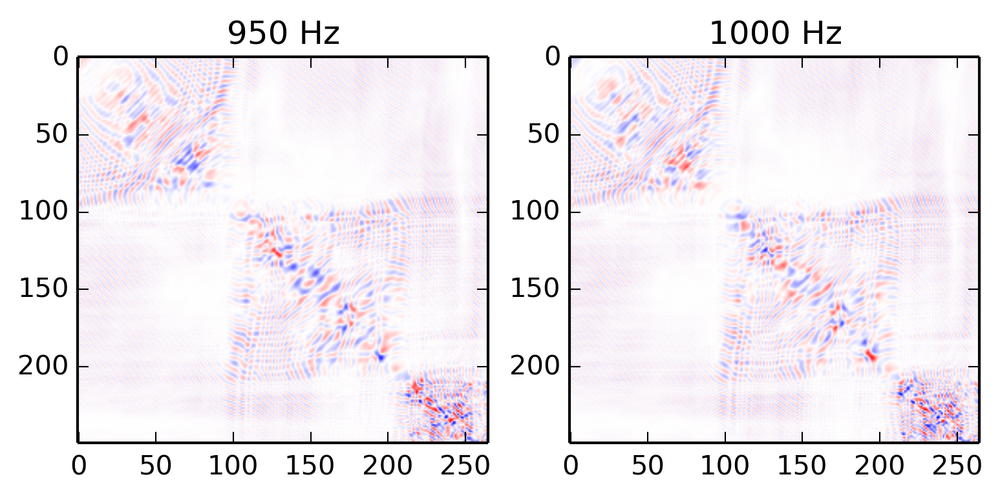

In [5]:
ncol = 2
nrow = int(ceil((1.*survey.nfreq) / ncol))

for j in xrange(nrow):
    fig = figure(dpi=300)
    for i in xrange(j*ncol, (j+1)*ncol):
        subplot(1, ncol, mod(i,ncol)+1)

        data = dPred[:,:,i].real
        clip = 0.8*abs(data).max()
        imshow(data, vmin=-clip, vmax=clip, cmap=cm.bwr)
        title('%0.0f Hz'%survey.freqs[i])